In [1]:
import numpy as np
import pandas as pd
import warnings
from scipy.stats import pearsonr
from tqdm import tqdm


warnings.filterwarnings('ignore')

# reminder that if you are installing libraries in a Google Colab instance you will be prompted to restart your kernal

try:
    import geemap, ee
    import seaborn as sns
    import matplotlib.izingpyplot as plt
except ModuleNotFoundError:
    if 'google.colab' in str(get_ipython()):
        print("package not found, installing w/ pip in Google Colab...")
        !pip install geemap seaborn matplotlib
    else:
        print("package not found, installing w/ conda...")
        !conda install mamba -c conda-forge -y
        !mamba install geemap -c conda-forge -y
        !conda install seaborn matplotlib -y
    import geemap, ee
    import seaborn as sns
    import matplotlib.pyplot as plt

package not found, installing w/ pip in Google Colab...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 7.4 MB/s eta 0:00:00


In [ ]:
try:
        ee.Initialize()
except Exception as e:
        ee.Authenticate()
        ee.Initialize()

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://code.earthengine.google.com/client-auth?scopes=https%3A//www.googleapis.com/auth/earthengine%20https%3A//www.googleapis.com/auth/devstorage.full_control&request_id=U3kl5EDE8qRxWN-Vh9gwo0RlISAsiamv5s1oPVVfm8c&tc=eymKUI3bIyLZ9ze5L1OK4rkILDXVVqVOa7L5McxZBwI&cc=5uekTKsIxPz1u-7h2DRcKnWRSkOYNYdqH0YcMgj8kyE

The authorization workflow will generate a code, which you should paste in the box below.
Enter verification code: 4/1AfJohXnrXmtPHXNiwCy0xAiZ30cnz8eD6bThb9h4360VkBppdJw9tvGwhSw

Successfully saved authorization token.


In [2]:
import os

from tqdm import tqdm

import itertools
import warnings
warnings.filterwarnings('ignore')

from matplotlib import gridspec
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
import matplotlib.dates as mdates
from matplotlib import cm
import matplotlib.ticker as mtick

import datetime
from scipy import stats
from scipy.stats import pearsonr
import statsmodels.api as sm

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

from google.colab import auth
import gspread
from google.auth import default
#autenticating to google
auth.authenticate_user()
creds, _ = default()
gc = gspread.authorize(creds)

Mounted at /content/drive


## Loading Resettlement Database

In [ ]:
worksheet = gc.open('Philippine Resettlement Sites Database - RPrincipe et al. (2023)').sheet1
rows = worksheet.get_all_values()

#Convert to a DataFrame
df = pd.DataFrame(rows)
#creating columns name
df.columns = df.iloc[0]
df = df.iloc[1:]
#convert 'strings' to 'float'
df['Latitude'] = pd.to_numeric(df['Latitude'], errors='coerce')
df['Longitude'] = pd.to_numeric(df['Longitude'], errors='coerce')
df['Buffer'] = pd.to_numeric(df['Buffer'], errors='coerce')
df.head()

,Calamity,Project Name,Location,Classification,Latitude,Longitude,Buffer,Title,Map URL,Remarks,External Links,External Links,Typhoon,Province,Group
1,Typhoon Yolanda (2013),Maya Park Homes,"Brgy. Maya, Daanbantayan, Cebu",Identified,11.271009,124.048967,230.0,Maya Park,https://goo.gl/maps/3L3eRoigGDpjMxHT8,,,https://newsinfo.inquirer.net/944060/poor-nha-...,Yolanda,Cebu,Cebu
2,Typhoon Yolanda (2013),Lanao Unity Park Homes,"Brgy. Lanao, Daanbantayan, Cebu",Identified,11.248469,124.022224,280.0,Lanao Unity Park,https://goo.gl/maps/5SZCHBveYJqorcZ87,,https://daanbantayan.gov.ph/2022/04/04/lanao-u...,,Yolanda,Cebu,Cebu
3,Typhoon Yolanda (2013),Green Heights 1 (Daanbantayan 3),"Brgy. Tominjao, Daanbantayan, Cebu",Probable,11.221464,124.036788,260.0,Daanbantayan 3,https://goo.gl/maps/gjzeHfJ73dMTdiuX8,,,,Yolanda,Cebu,Cebu
4,Typhoon Yolanda (2013),Green Heights 2 (Daanbantayan 4),"Brgy. Tominjao, Daanbantayan, Cebu",Identified,11.173075,124.015380,160.0,Daanbantayan 4,https://goo.gl/maps/1PfPDyVLY4bHvp78A,Adress was wrong on the NHA list. Turn-over da...,https://www.facebook.com/photo/?fbid=165837642...,,Yolanda,Cebu,Cebu
5,Typhoon Yolanda (2013),Kandaya Homes 1 (Daanbantayan Site 1),"Brgy. Tapilon, Daanbantayan Site 1, Cebu",Identified,11.260164,124.036611,160.0,Daanbantayan Site 1,https://goo.gl/maps/2esB7Pmhx5NuNjYYA,Sites were raffled off to beneficiaries. Shape...,https://www.facebook.com/DaanbantayanLGU/photo...,https://www.facebook.com/DaanbantayanLGU/photo...,Yolanda,Cebu,Cebu


In [ ]:
df = df[df['Buffer'].notna()].reset_index()
df

,index,Calamity,Project Name,Location,Classification,Latitude,Longitude,Buffer,Title,Map URL,Remarks,External Links,External Links,Typhoon,Province,Group
0,1,Typhoon Yolanda (2013),Maya Park Homes,"Brgy. Maya, Daanbantayan, Cebu",Identified,11.271009,124.048967,230.0,Maya Park,https://goo.gl/maps/3L3eRoigGDpjMxHT8,,,https://newsinfo.inquirer.net/944060/poor-nha-...,Yolanda,Cebu,Cebu
1,2,Typhoon Yolanda (2013),Lanao Unity Park Homes,"Brgy. Lanao, Daanbantayan, Cebu",Identified,11.248469,124.022224,280.0,Lanao Unity Park,https://goo.gl/maps/5SZCHBveYJqorcZ87,,https://daanbantayan.gov.ph/2022/04/04/lanao-u...,,Yolanda,Cebu,Cebu
2,3,Typhoon Yolanda (2013),Green Heights 1 (Daanbantayan 3),"Brgy. Tominjao, Daanbantayan, Cebu",Probable,11.221464,124.036788,260.0,Daanbantayan 3,https://goo.gl/maps/gjzeHfJ73dMTdiuX8,,,,Yolanda,Cebu,Cebu
3,4,Typhoon Yolanda (2013),Green Heights 2 (Daanbantayan 4),"Brgy. Tominjao, Daanbantayan, Cebu",Identified,11.173075,124.015380,160.0,Daanbantayan 4,https://goo.gl/maps/1PfPDyVLY4bHvp78A,Adress was wrong on the NHA list. Turn-over da...,https://www.facebook.com/photo/?fbid=165837642...,,Yolanda,Cebu,Cebu
4,5,Typhoon Yolanda (2013),Kandaya Homes 1 (Daanbantayan Site 1),"Brgy. Tapilon, Daanbantayan Site 1, Cebu",Identified,11.260164,124.036611,160.0,Daanbantayan Site 1,https://goo.gl/maps/2esB7Pmhx5NuNjYYA,Sites were raffled off to beneficiaries. Shape...,https://www.facebook.com/DaanbantayanLGU/photo...,https://www.facebook.com/DaanbantayanLGU/photo...,Yolanda,Cebu,Cebu
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262,444,Typhoon Pepeng (2009),Tuba Resettlement Proj.,"Tuba, Benguet",Probable,14.604640,121.260761,450.0,Tuba Res,Google Maps Link,,,,Pepeng,Benguet,Luzon
263,462,Typhoon Yolanda (2013),Brgy. Baldat (28 units),"Culion, Palawan",Probable,11.891470,119.987950,60.0,Badat,Apple Maps Link,,,,Yolanda,Palawan,Luzon
264,463,Typhoon Yolanda (2013),Brgy. Binudac (406 units),"Culion, Palawan",Probable,11.820858,119.907452,100.0,Binudac,,Probable Says it mentions 406 units but the un...,,,Yolanda,Palawan,
265,464,Typhoon Yolanda (2013),"Brgy. Galoc (274 units), Culion, Palawan","Culion, Palawan",Probable,11.922839,119.879509,250.0,Galoc,,Still in the process; Buffer size also not sur...,,,Yolanda,Palawan,


## Philippine Region Codes

In [ ]:
reg_names =  ['NCR',
              'CAR',
              'Region I',
              'Region II',
              'Region III',
              'Region IV-A',
              'Region IV-B',
              'Region V',
              'Region VI',
              'Region VII',
              'Region VIII',
              'Region IX',
              'Region X',
              'Region XI',
              'Region XII',
              'Region XIII',
              'ARMM']
reg_codes =  [2355,
              2354,
              2356,
              2357,
              67165,
              67166,
              67167,
              2361,
              2362,
              2363,
              2364,
              67159,
              67160,
              67161,
              67162,
              2368,
              67156]

# Functions

## `time_series_()`

### return the mean values only

In [ ]:
# def time_series_(lat, lon, buffer):
#     def poi_mean(img):
#         img = img.updateMask(img.gte(0)) #collect NTL images that are greater than or equal to zero
#         mean = img.reduceRegion(reducer=ee.Reducer.mean(), geometry=poi, scale=500).get('avg_rad') #get the average radiance on a circular POI
#         return img.set('date', img.date().format()).set('mean',mean)

#     poi = ee.Geometry.Point(lat, lon).buffer(buffer)
#     viirs = ee.ImageCollection("NOAA/VIIRS/DNB/MONTHLY_V1/VCMSLCFG").filterDate('2014-01-01','2023-12-31')
#     poi_reduced_imgs = viirs.map(poi_mean)
#     nested_list = poi_reduced_imgs.reduceColumns(ee.Reducer.toList(1), ['mean']).values().get(0)
#     data = pd.DataFrame(nested_list.getInfo(), columns=['mean'])
#     data = data['mean'].values.tolist()
#     return data

### return the date and mean values

In [ ]:
def time_series_(lat, lon, buffer):
    def poi_mean(img):
        # img = img.updateMask(img.gt(0))
        mean = img.reduceRegion(reducer=ee.Reducer.mean(), geometry=poi, scale=500).get('avg_rad')
        return img.set('date', img.date().format()).set('mean',mean)

    poi = ee.Geometry.Point(lat, lon).buffer(buffer)
    viirs = ee.ImageCollection("NOAA/VIIRS/DNB/MONTHLY_V1/VCMSLCFG").filterDate('2014-01-01','2023-12-31')
    poi_reduced_imgs = viirs.map(poi_mean)
    nested_list = poi_reduced_imgs.reduceColumns(ee.Reducer.toList(2), ['date', 'mean']).values().get(0)
    data = pd.DataFrame(nested_list.getInfo(), columns=['date','mean'])
    data = data.set_index('date')

    # data = data['mean'].values.tolist()
    return data

## `NTL_dataset_initialize()`



In [ ]:
def NTL_dataset_initialize(Province, Region):

  viirs = ee.ImageCollection('NOAA/VIIRS/DNB/MONTHLY_V1/VCMSLCFG').filter(ee.Filter.date('2014-01-01', '2023-12-01'))
  province = ee.Feature(ee.FeatureCollection("FAO/GAUL/2015/level2").filter(ee.Filter.eq('ADM2_NAME', Province)).first()).geometry()
  region = ee.Feature(ee.FeatureCollection("FAO/GAUL/2015/level1").filter(ee.Filter.eq('ADM1_CODE', Region)).first()).geometry()

  def get_prov_mean(img):
      #img = img.updateMask(img.gt(0))
      mean = img.reduceRegion(reducer=ee.Reducer.mean(), geometry=province, scale=500, maxPixels=1e9).get('avg_rad')
      return img.set('date', img.date().format()).set('mean',mean)

  def get_reg_mean(img):
      #img = img.updateMask(img.gt(0))
      mean = img.reduceRegion(reducer=ee.Reducer.mean(), geometry=region, scale=500, maxPixels=1e9).get('avg_rad')
      return img.set('date', img.date().format()).set('mean',mean)

  # reduce collection
  prov_mean = viirs.map(get_prov_mean)
  reg_mean = viirs.map(get_reg_mean)

  # get lists
  nested_list = prov_mean.reduceColumns(ee.Reducer.toList(2), ['date','mean']).values().get(0)
  nested_list_2 = reg_mean.reduceColumns(ee.Reducer.toList(1), ['mean']).values().get(0)
  regional_NTL = np.asarray(nested_list_2.getInfo()).squeeze()

  # convert to dataframe
  NTL_dataset = pd.DataFrame(nested_list.getInfo(), columns=['date', str(Province) + ' Province'])
  NTL_dataset['date'] = pd.to_datetime(NTL_dataset['date'])
  NTL_dataset = NTL_dataset.set_index('date')
  NTL_dataset.index = pd.to_datetime(NTL_dataset.index )
  NTL_dataset.insert(1, str(reg_names[reg_codes.index(Region)]), regional_NTL)

  # plt.plot(NTL_dataset)
  # plt.show()
  return NTL_dataset

# NTL_dataset_initialize('Leyte',2364)

In [ ]:
# province = 'Leyte'
# code = 2364
# period = 12

province = 'Cebu'
code = 2363
period = 12

In [ ]:
NTL_dataset = NTL_dataset_initialize(province,code)
# NTL_dataset[:37] = NTL_dataset[:37] + 0.125
NTL_dataset

,Cebu Province,Region VII
date,,
2014-01-01,0.852718,0.348493
2014-02-01,0.897082,0.364470
2014-03-01,0.951766,0.404833
2014-04-01,1.111465,0.544345
2014-05-01,0.956443,0.435869
...,...,...
2023-05-01,1.625340,0.919485
2023-06-01,1.779795,0.964201
2023-07-01,0.046129,0.047098


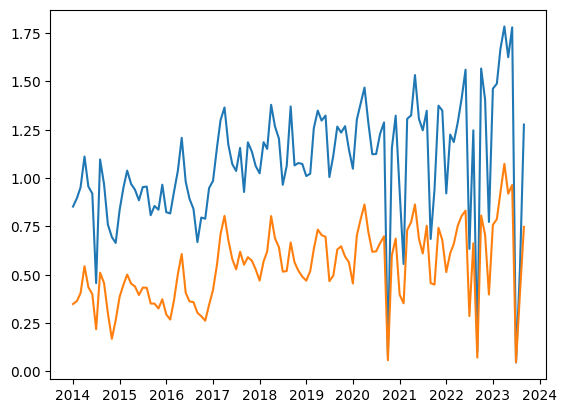

In [ ]:

plt.plot(NTL_dataset)

In [ ]:
idx = pd.date_range(start="2014-01-01",end="2023-09-01", freq='MS')
len(idx)

117

In [ ]:
idx = pd.date_range(start="2014-01-01",end="2017-01-01", freq='MS')
len(idx)

37

In [ ]:
# province = 'Leyte'
# code = 2364
# period = 12

region = str(reg_names[reg_codes.index(code)])

prov_df = df.loc[df['Province']==province,:]
prov_df = prov_df.reset_index(drop=True)
prov_df.index = prov_df.index + 1

for i in tqdm(range(1,len(prov_df)+1), desc = region + ": Processing"):
# for i in tqdm(range(1,3), desc = region + ": Processing"):

  NTL_data = time_series_(prov_df['Latitude'][i], prov_df['Longitude'][i], prov_df['Buffer'][i])
  NTL_data.index = pd.to_datetime(NTL_data.index)
  idx = pd.date_range(start="2014-01-01",end="2023-09-01", freq='MS')
  NTL_data = NTL_data.reindex(idx)
  # NTL_data = NTL_data.interpolate(limit_direction='both')
  NTL_dataset.insert(i+1, prov_df['Title'][i], NTL_data)

NTL_dataset

Region VIII: Processing: 100%|██████████| 38/38 [00:36<00:00,  1.03it/s]


,Leyte Province,Region VIII,Kawayan Ville,Villa Diana,Ridge View Park,New Hope Village,Guadalupe Heights,Knightsridge Residences,VIlla Sofia,North Hill Arbours,...,Virlyn Heights,Tabango Ville,Dulag Town Ville,Barugo Town Ville,Villa Verde,Capoocan Village,Dagami Town Ville,Sta. Fe Village Site 1,Pope Francis Village,Cool Spring Residences
date,,,,,,,,,,,,,,,,,,,,,
2014-01-01,0.101630,0.087372,0.262384,0.225237,0.240081,0.259939,0.251340,0.250861,0.207366,0.278039,...,0.291135,0.310377,0.194297,0.268257,0.319485,0.316717,0.228779,0.378767,0.202459,0.309143
2014-02-01,0.170149,0.114812,0.111189,0.107876,0.143410,0.163447,0.116268,0.108903,0.098870,0.126072,...,0.157059,0.076356,0.150536,0.093959,0.114762,0.076314,0.121424,0.154276,0.087855,0.135137
2014-03-01,0.138900,0.098264,0.059881,NaN,0.007060,0.065777,0.046909,0.054506,0.092130,0.044625,...,0.075840,0.018101,0.103432,NaN,0.074546,0.078740,0.042749,0.113776,0.019366,0.066702
2014-04-01,0.217183,0.181112,NaN,NaN,0.099713,NaN,0.015475,0.078866,0.064774,NaN,...,NaN,NaN,0.059975,0.042832,NaN,NaN,NaN,0.295723,0.268188,0.091253
2014-05-01,0.172025,0.111598,0.121251,NaN,0.047443,NaN,0.074698,0.066565,NaN,NaN,...,0.383972,0.290337,NaN,0.053607,NaN,NaN,NaN,NaN,0.022946,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-01,0.701959,0.529153,0.648243,0.811948,0.591814,0.431255,0.660739,0.643906,0.574933,0.732504,...,0.524634,0.000000,0.570000,0.428177,0.000000,0.000000,0.000000,0.537979,0.559785,0.165714
2023-06-01,0.618948,0.461296,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2023-07-01,0.148886,0.147419,1.413277,1.359351,1.327103,1.486052,1.377904,1.391000,1.296726,1.438504,...,0.000000,0.000000,0.000000,1.216108,1.208824,0.000000,0.000000,1.458723,1.362270,0.000000


In [ ]:
# # Check for NaN values in NTL_data
# nan_check = NTL_dataset.isna().sum()

# # Display the result
# print("NaN values in NTL_data:")
# print(nan_check)
# #

### `plot_STL(dataframe)`

In [ ]:
# def plot_STL(dataframe):
#     print("Plotting timeseries NTL data")

#     fig, ax = plt.subplots(nrows=4,ncols=1, sharex='col',
#                       gridspec_kw={'height_ratios':[0.75,2,0.75,0.5]},
#                       figsize=(10,8), dpi = 150)

#     date = dataframe.index

#     trend = dataframe['Trend']
#     seasonality = dataframe['Seasonality']
#     residual = dataframe['Residual']

#     province = dataframe['Raw'].columns[0]
#     region = dataframe['Raw'].columns[1]

#     NTL_dataset = dataframe['Raw']
#     prov_df = NTL_dataset.iloc[:, 2:]
#     sites = prov_df.columns

#     ax[0].plot(NTL_dataset.iloc[:,0], 'b.-', drawstyle = 'steps-mid',  linewidth = 3, alpha = 0.5)
#     ax[0].plot(NTL_dataset.iloc[:,1], 'k.-', drawstyle = 'steps-mid', linewidth = 2, alpha = 0.5)

#     ax[1].plot(trend.iloc[:,0], 'b.-', drawstyle = 'steps-mid', label= str(province),  linewidth = 3, alpha = 0.8)
#     ax[1].plot(trend.iloc[:,1], 'k.-', drawstyle = 'steps-mid', label= str(region), linewidth = 2, alpha = 0.8)
#     ax[2].plot(seasonality.iloc[:,0], 'b-', drawstyle = 'steps-mid',  linewidth = 1.5, alpha = 0.8)
#     ax[2].plot(seasonality.iloc[:,1], 'k-', drawstyle = 'steps-mid', linewidth = 1, alpha = 0.8)
#     ax[3].bar(date, residual.iloc[:,0], color = 'b',  width = 15, alpha = 0.8)
#     ax[3].bar(date, residual.iloc[:,1], color = 'k', width = 12,  alpha = 0.8)

#     for i in tqdm(range(len(sites)), desc = 'Processing: '):

#       data = NTL_dataset.iloc[:,i+2].values
#       line_color = plt.cm.Spectral(i/len(sites))

#       ax[0].plot(date, data, color = line_color, linewidth = 1, alpha = 0.8)
#       ax[0].set_ylabel('$nW ·cm^{−2}·sr^{−1}$')

#       ax[1].plot(date, trend.iloc[:,i+2], color = line_color,
#                 linewidth = 2, alpha = 0.8, label= NTL_dataset.columns[i+2])
#       ax[1].set_ylabel('trend')

#       ax[2].plot(date, seasonality.iloc[:,i+2], color = line_color,
#                 linewidth = 1, alpha = 0.6)
#       ax[2].set_ylabel('seasonality')

#       resid = residual.iloc[:,i+2]
#       ax[3].bar(date, resid, width = 10, color = line_color, alpha = 0.8)
#       ax[3].set_ylabel('residual')


#     ax[1].legend(fontsize=7, ncol = 5, bbox_to_anchor= (0, 1.05, 1, 0.5), loc="lower left",
#                 bbox_transform=ax[0].transAxes, fancybox = True, mode='expand')

#     for ax in ax:
#       ax.grid(alpha = 0.5)
#       ax.axvline(datetime.date(2020, 3, 10), color = 'r', lw = 5, alpha = 0.2) #For COVID lockdown
#       ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.1f')) # 2 decimal places)
#       ax.minorticks_on()
#       ax.xaxis.grid(True, which='minor', alpha = 0.2)


#     dtFmt = mdates.DateFormatter('%b-%Y') # define the formatting
#     plt.gca().xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis

#     results_path = '/content/drive/MyDrive/Research - PhD/Results/Resettlements/Trial 3/'
#     plt.savefig(results_path+"/TS-"+str(province)+".png", bbox_inches="tight")
#     plt.tight_layout()
#     plt.show()

## `STL_extraction()`

In [ ]:
def STL_extraction(province, code, period):

    region = str(reg_names[reg_codes.index(code)])

    print("Processing NTL extraction for Resettlement Sites in " + str(province) + " Province, " + str(region))
    NTL_dataset = NTL_dataset_initialize(province, code)

    prov_df = df.loc[df['Province']==province,:]
    prov_df = prov_df.reset_index(drop=True)
    prov_df.index = prov_df.index + 1

    for i in tqdm(range(1,len(prov_df)+1), desc = region + ": Processing"):
    # for i in tqdm(range(1,3), desc = region + ": Processing"):

      NTL_data = time_series_(prov_df['Latitude'][i], prov_df['Longitude'][i], prov_df['Buffer'][i])
      NTL_data.index = pd.to_datetime(NTL_data.index)
      idx = pd.date_range(start="2014-01-01",end="2023-09-01", freq='MS')
      NTL_data = NTL_data.reindex(idx)
      # NTL_data = NTL_data.interpolate(limit_direction='both')
      NTL_dataset.insert(i+1, prov_df['Title'][i], NTL_data)

      # NTL_dataset[:37] = NTL_dataset[:37] + 0.125

      # NTL_dataset.insert(i+1, prov_df['Project Name'][i], NTL_data)

  # Drop rows with missing values
    NTL_dataset = NTL_dataset.dropna()

    trend = NTL_dataset.copy()
    seasonality = NTL_dataset.copy()
    residual = NTL_dataset.copy()

    for loc in tqdm(NTL_dataset.columns, desc = 'STL Decomposition'):
      data = NTL_dataset[loc].values
      # data = pd.Series(data).interpolate().values

      decomposition = sm.tsa.seasonal_decompose(data, model='additive', period = period)
      trend[loc] = decomposition.trend
      seasonality[loc] = decomposition.seasonal
      residual[loc] = decomposition.resid

    dataframe = pd.concat([NTL_dataset,trend, seasonality, residual], axis = 1, keys = ['Raw', 'Trend', 'Seasonality', 'Residual'])

    plot_STL(dataframe)

    return dataframe

In [ ]:
dataframe = STL_extraction(province = 'Leyte', code = 2364, period = 12)
dataframe

Processing NTL extraction for Resettlement Sites in Leyte Province, Region VIII


KeyboardInterrupt: ignored

In [ ]:
def plot_STL(dataframe):
    print("Plotting timeseries NTL data")

    fig, ax = plt.subplots(nrows=4,ncols=1, sharex='col',
                      gridspec_kw={'height_ratios':[0.75,2,0.75,0.5]},
                      figsize=(10,10), dpi = 150)

    date = dataframe.index

    trend = dataframe['Trend']
    seasonality = dataframe['Seasonality']
    residual = dataframe['Residual']

    province = dataframe['Raw'].columns[0]
    region = dataframe['Raw'].columns[1]

    NTL_dataset = dataframe['Raw']
    prov_df = NTL_dataset.iloc[:, 2:]
    sites = prov_df.columns

    ax[0].plot(NTL_dataset.iloc[:,0], 'b.-', drawstyle = 'steps-mid',  linewidth = 3, alpha = 0.5)
    ax[0].plot(NTL_dataset.iloc[:,1], 'k.-', drawstyle = 'steps-mid', linewidth = 2, alpha = 0.5)

    ax[1].plot(trend.iloc[:,0], 'b.-', drawstyle = 'steps-mid', label= str(province),  linewidth = 3, alpha = 0.8)
    ax[1].plot(trend.iloc[:,1], 'k.-', drawstyle = 'steps-mid', label= str(region), linewidth = 2, alpha = 0.8)
    ax[2].plot(seasonality.iloc[:,0], 'b-', drawstyle = 'steps-mid',  linewidth = 1.5, alpha = 0.8)
    ax[2].plot(seasonality.iloc[:,1], 'k-', drawstyle = 'steps-mid', linewidth = 1, alpha = 0.8)
    ax[3].bar(date, residual.iloc[:,0], color = 'b',  width = 15, alpha = 0.8)
    ax[3].bar(date, residual.iloc[:,1], color = 'k', width = 12,  alpha = 0.8)

    for i in tqdm(range(len(sites)), desc = 'Processing: '):

      data = NTL_dataset.iloc[:,i+2].values
      line_color = plt.cm.Spectral(i/len(sites))

      ax[0].plot(date, data, color = line_color, linewidth = 1, alpha = 0.8)
      ax[0].set_ylabel('NTL ($y_t$)')#$, $nW ·cm^{−2}·sr^{−1}$')

      ax[1].plot(date, trend.iloc[:,i+2], color = line_color,
                linewidth = 2, alpha = 0.8, label= NTL_dataset.columns[i+2])
      ax[1].set_ylabel('trend ($T_t$)')

      ax[2].plot(date, seasonality.iloc[:,i+2], color = line_color,
                linewidth = 1, alpha = 0.6)
      ax[2].set_ylabel('seasonality ($S_t$)')

      resid = residual.iloc[:,i+2]
      ax[3].bar(date, resid, width = 10, color = line_color, alpha = 0.8)
      ax[3].set_ylabel('residual ($E_t$)')


    ax[1].legend(fontsize=7, ncol = 5, bbox_to_anchor= (0, 1.05, 1, 0.5), loc="lower left",
                bbox_transform=ax[0].transAxes, fancybox = True, mode='expand')

    for ax in ax:
      ax.grid(alpha = 0.5)
      ax.axvline(datetime.date(2020, 3, 10), color = 'r', lw = 5, alpha = 0.2) #For COVID lockdown
      ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.1f')) # 2 decimal places)
      ax.minorticks_on()
      ax.xaxis.grid(True, which='minor', alpha = 0.2)


    dtFmt = mdates.DateFormatter('%Y') # define the formatting
    plt.gca().xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis

    results_path = '/content/drive/MyDrive/Research - PhD/Results/Resettlements/Trial 3/'
    plt.savefig(results_path+"/TS-"+str(province)+".png", bbox_inches="tight")
    plt.show()

Plotting timeseries NTL data


Processing: 100%|██████████| 38/38 [00:06<00:00,  5.92it/s]


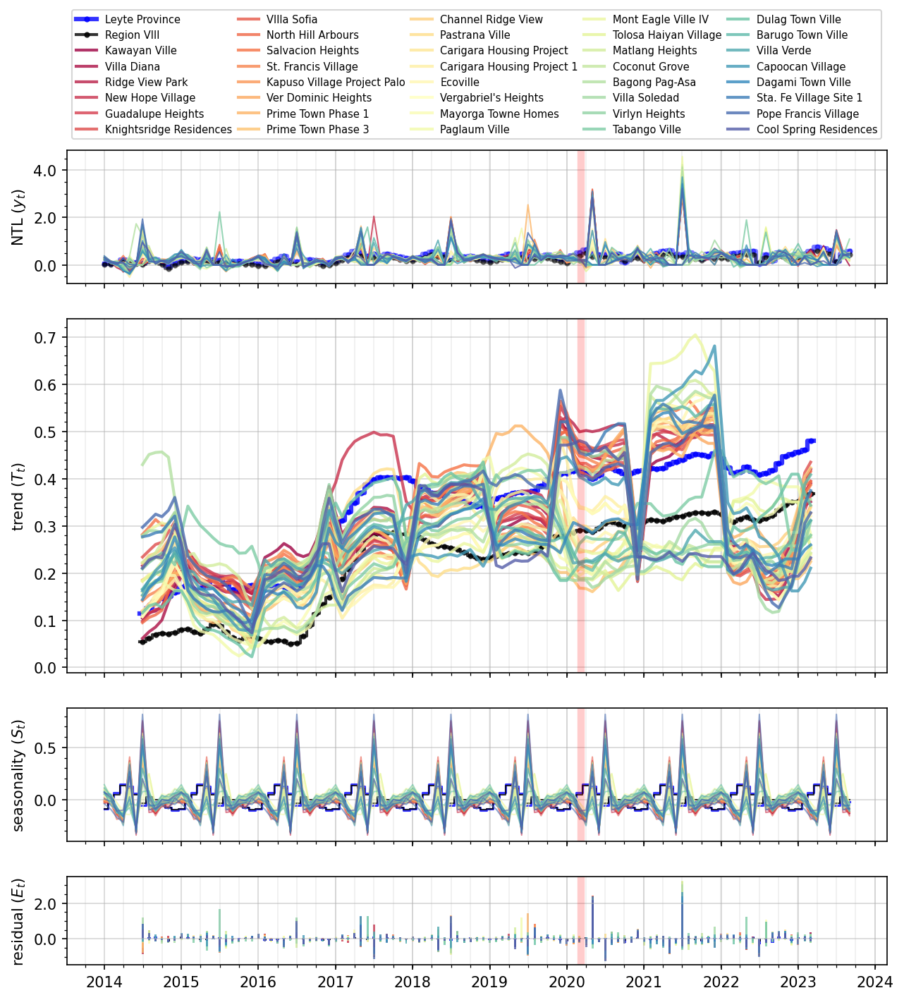

In [ ]:
plot_STL(dataframe)

## `stats_summary()`

In [ ]:
results_path = '/content/drive/MyDrive/Research - PhD/Results/Resettlements/Trial 3/'

In [ ]:
def stats_summary(province, code, period):
    dataframe = STL_extraction(province, code, period)
    dataset = dataframe['Trend'].dropna()
    dataframe.to_csv(results_path + "NTL STL 3/" +  str(province) + '_df.csv')

    stats_summary = pd.DataFrame(index = dataset.columns,
                                columns = ['slope', 'intercept', 'r', 'p', 'std'])
    for i in tqdm(range(len(dataset.columns))):
      loc = dataset.columns[i]
      y = dataset[loc]
      x = np.arange(len(y))
      slope, intercept, r_value, p_value, std_err = stats.linregress(x,y)
      stats_summary.loc[loc] = np.asarray(stats.linregress(x,y))

    stats_summary.to_csv(results_path + "Trend Stats 3/" + str(province) + '_stats.csv')

    return dataframe, stats_summary

# Data Collection and Processing

### Leyte

Processing NTL extraction for Resettlement Sites in Leyte Province, Region VIII


STL Decomposition: 100%|██████████| 40/40 [00:00<00:00, 706.30it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 38/38 [00:05<00:00,  7.52it/s]


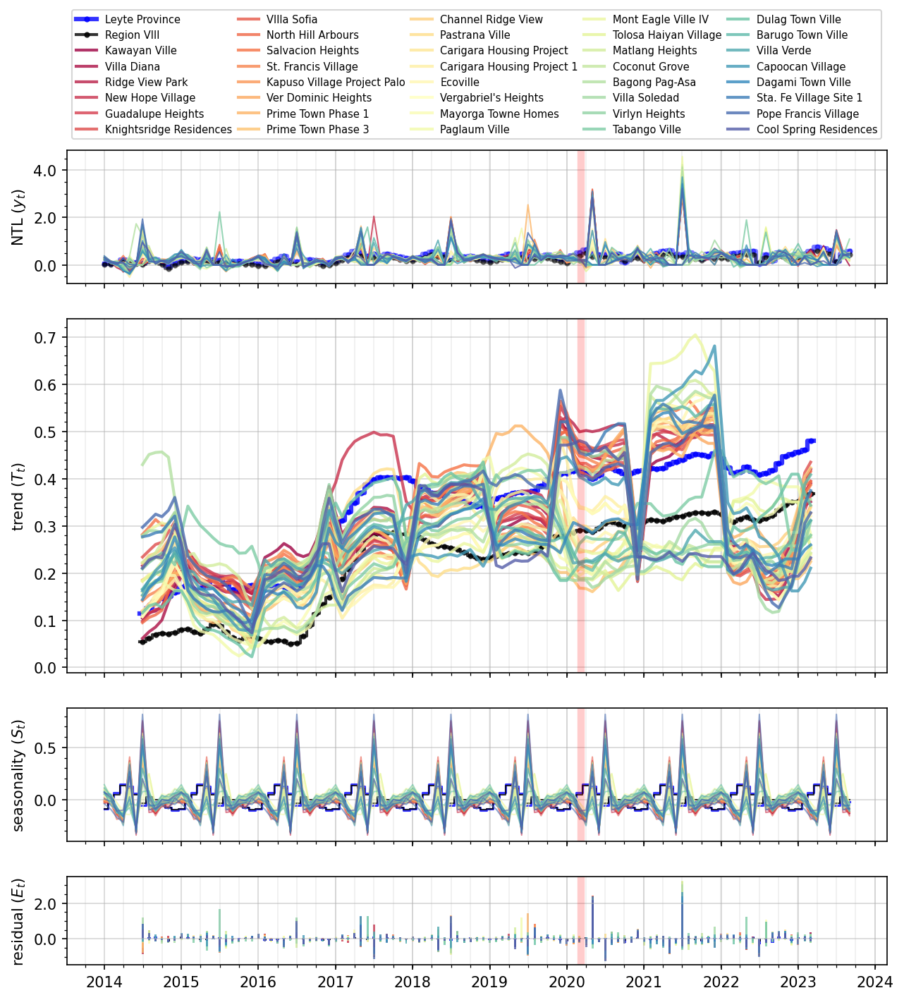

100%|██████████| 40/40 [00:00<00:00, 1573.42it/s]


In [ ]:
Leyte_df, Leyte_stats = stats_summary(province = 'Leyte', code = 2364, period = 12)

### Cebu

In [ ]:
# Cebu_df, Cebu_stats = stats_summary(province = 'Cebu', code = 2363, period = 12)

Processing NTL extraction for Resettlement Sites in Cebu Province, Region VII


STL Decomposition: 100%|██████████| 25/25 [00:00<00:00, 609.66it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 23/23 [00:02<00:00,  8.24it/s]


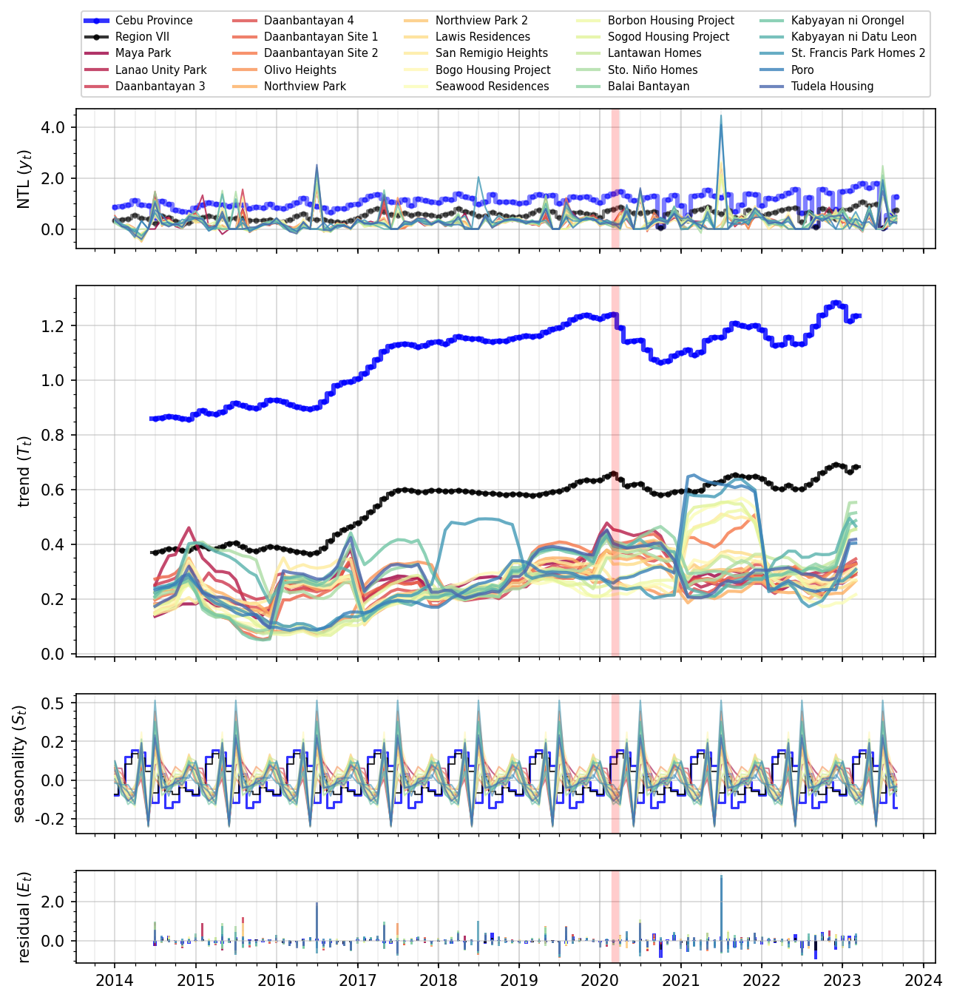

100%|██████████| 25/25 [00:00<00:00, 919.21it/s]


In [ ]:
Cebu_df, Cebu_stats = stats_summary(province = 'Cebu', code = 2363, period = 12)

### Samar

Processing NTL extraction for Resettlement Sites in Samar Province, Region VIII


STL Decomposition: 100%|██████████| 22/22 [00:00<00:00, 489.40it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 20/20 [00:03<00:00,  5.59it/s]


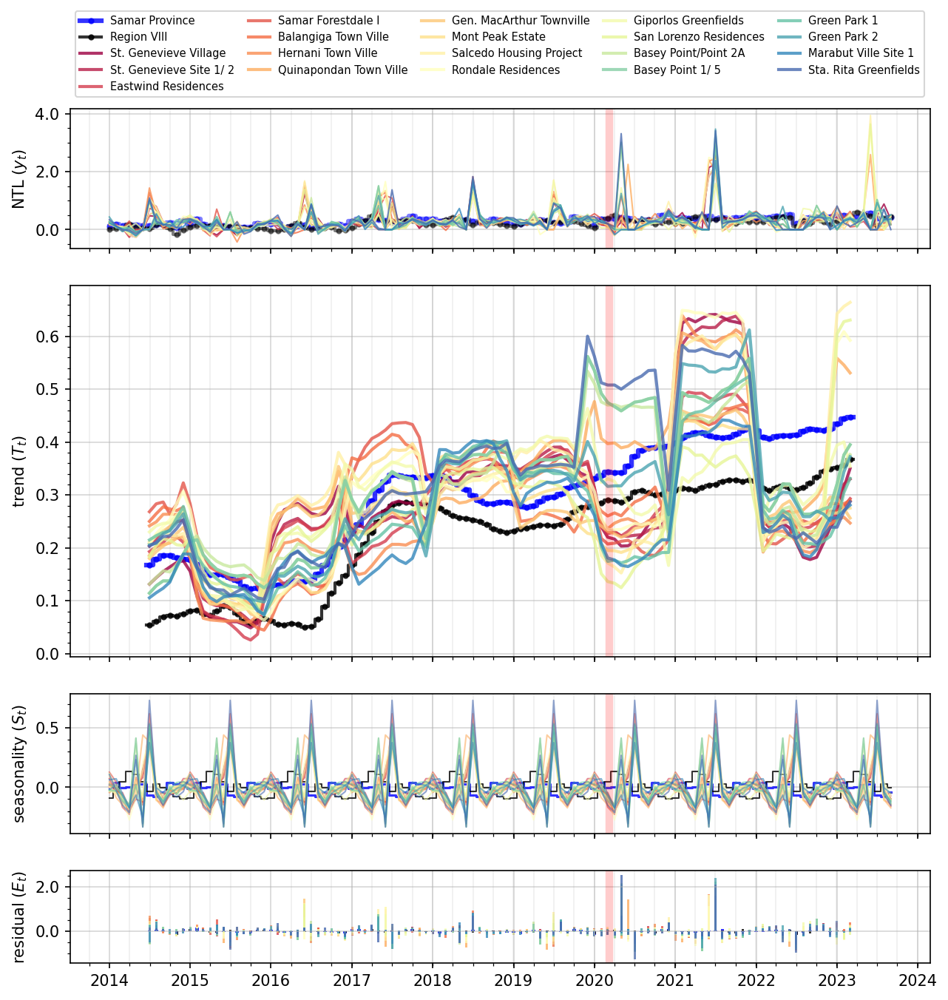

100%|██████████| 22/22 [00:00<00:00, 1136.65it/s]


In [ ]:
Samar_df, Samar_stats = stats_summary(province = 'Samar', code = 2364, period = 12)

### Biliran

Processing NTL extraction for Resettlement Sites in Biliran Province, Region VIII


STL Decomposition: 100%|██████████| 13/13 [00:00<00:00, 326.36it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 11/11 [00:02<00:00,  4.81it/s]


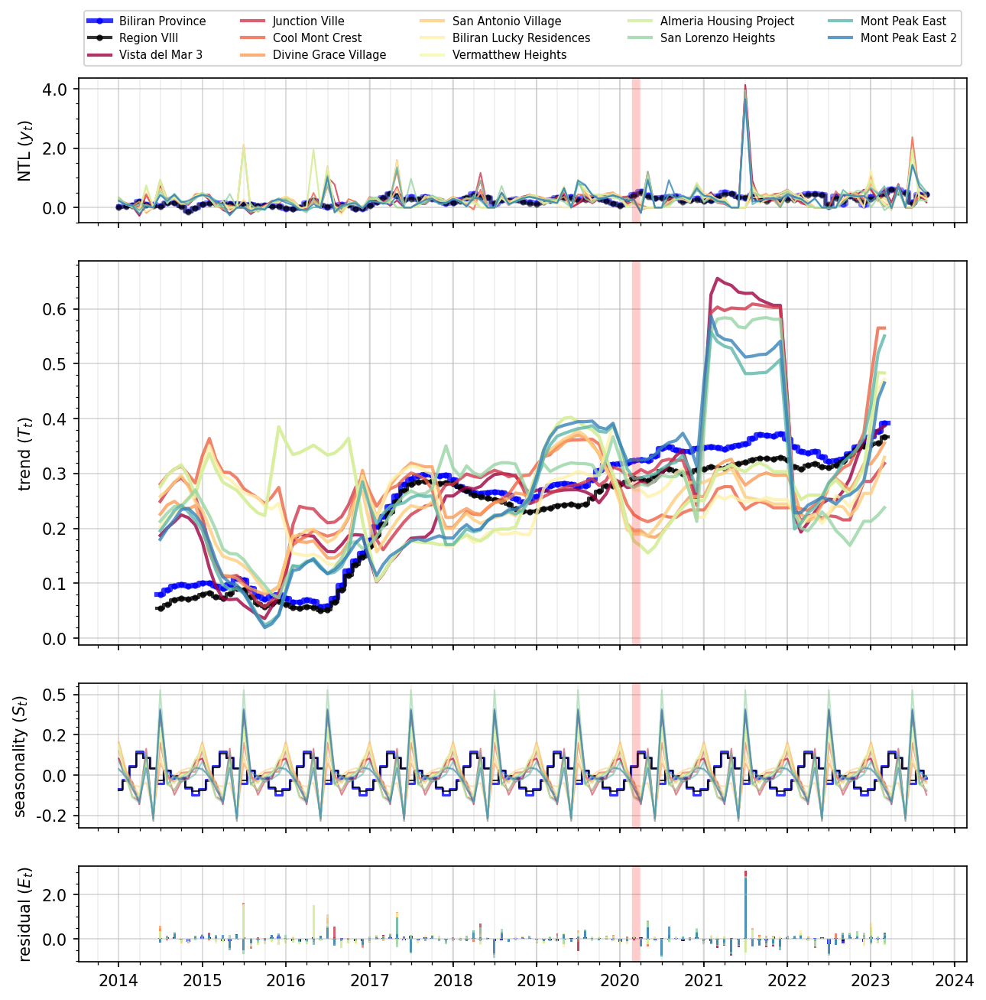

100%|██████████| 13/13 [00:00<00:00, 1292.64it/s]


In [ ]:
Biliran_df, Biliran_stats = stats_summary(province = 'Biliran', code = 2364, period = 12)

### Aklan


Processing NTL extraction for Resettlement Sites in Aklan Province, Region VI


STL Decomposition: 100%|██████████| 15/15 [00:00<00:00, 406.10it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 13/13 [00:02<00:00,  5.42it/s]


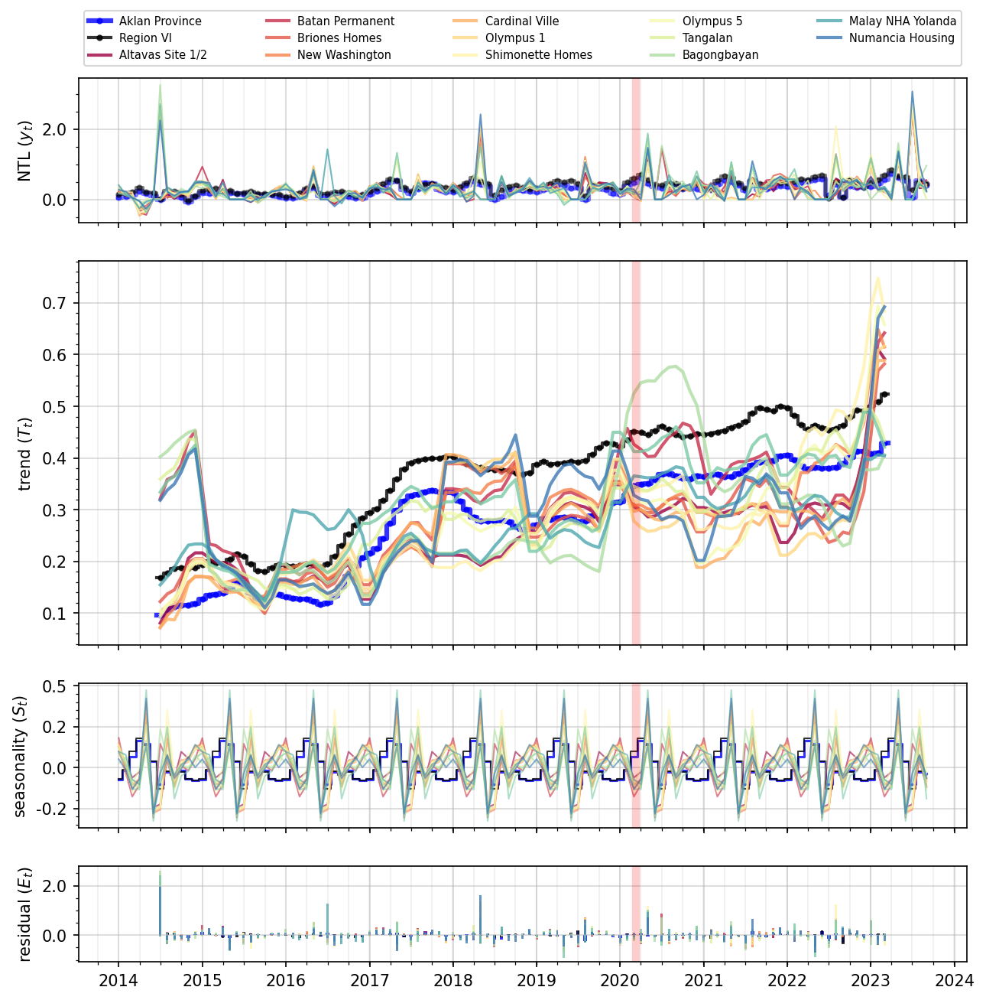

100%|██████████| 15/15 [00:00<00:00, 1214.90it/s]


In [ ]:
Aklan_df, Aklan_stats = stats_summary(province = 'Aklan', code = 2362, period = 12)

### Antique

Processing NTL extraction for Resettlement Sites in Antique Province, Region VI


STL Decomposition: 100%|██████████| 28/28 [00:00<00:00, 453.17it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 26/26 [00:04<00:00,  5.72it/s]


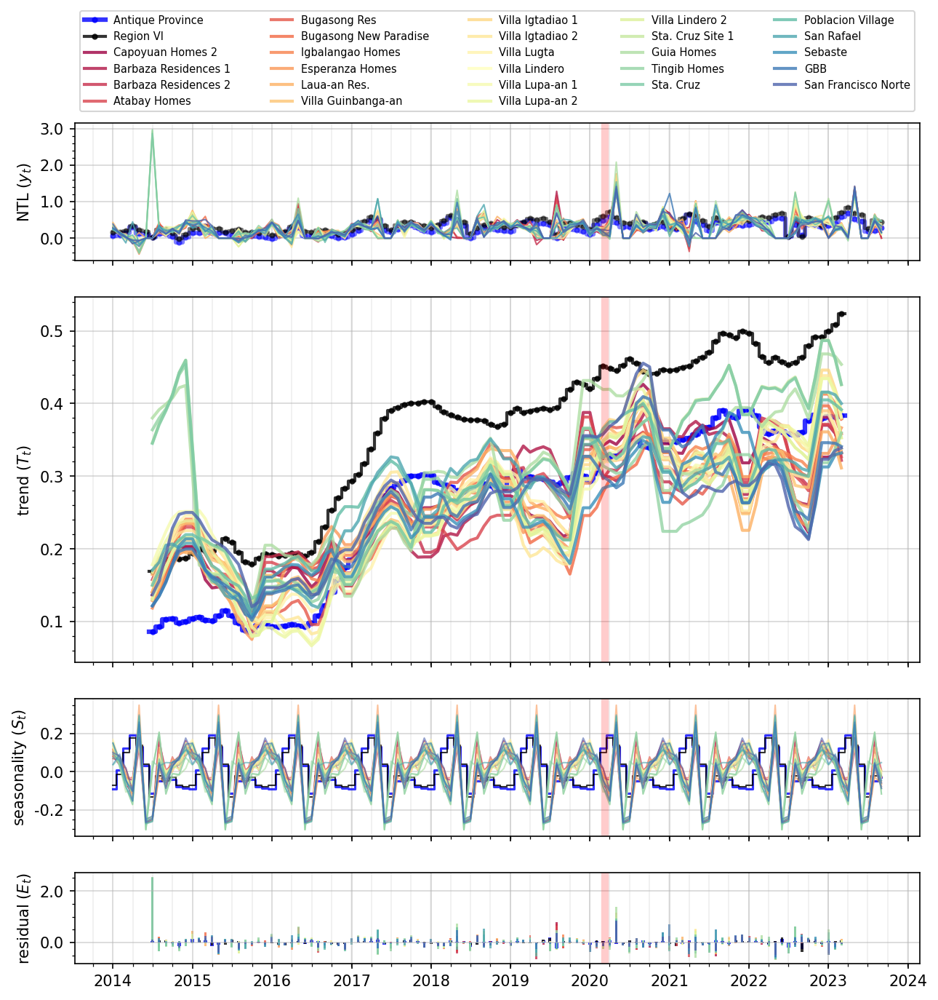

100%|██████████| 28/28 [00:00<00:00, 1484.07it/s]


In [ ]:
Antique_df, Antique_stats = stats_summary(province = 'Antique', code = 2362, period = 12)

### Misamis Oriental

Processing NTL extraction for Resettlement Sites in Misamis Oriental Province, Region X


STL Decomposition: 100%|██████████| 18/18 [00:00<00:00, 767.59it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 16/16 [00:02<00:00,  7.07it/s]


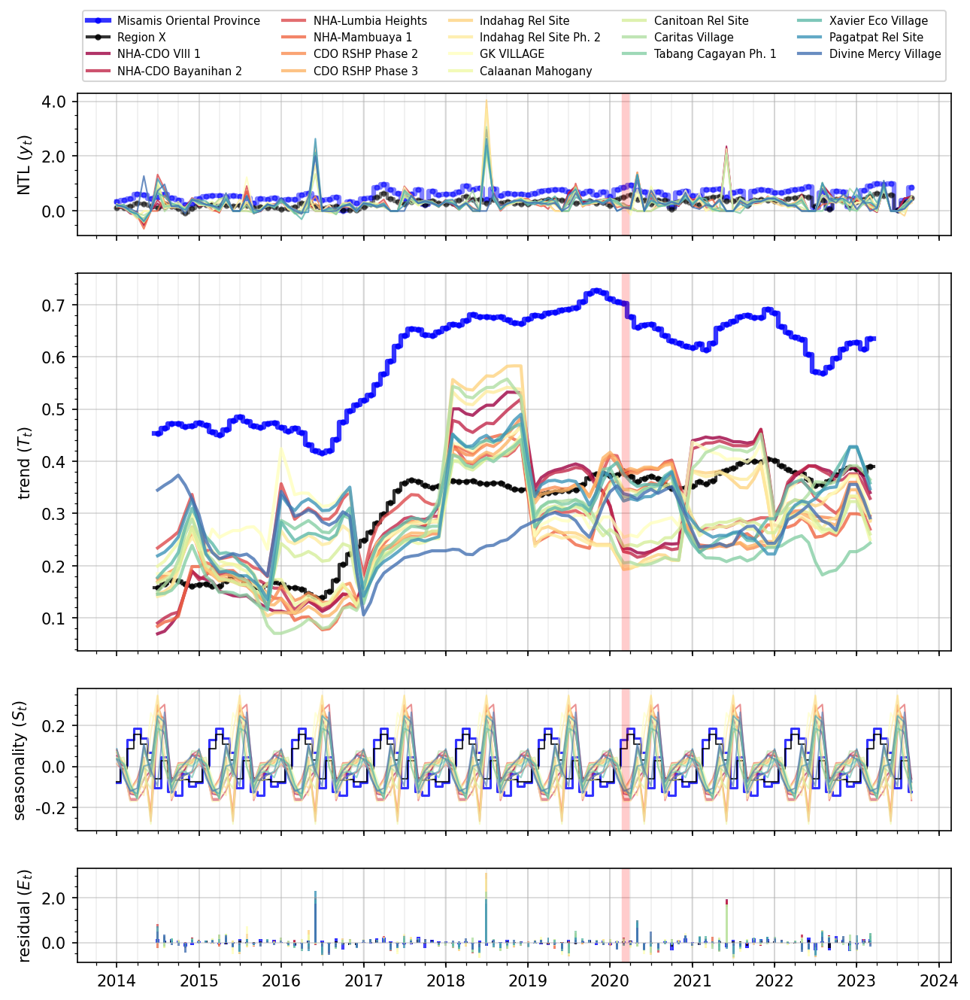

100%|██████████| 18/18 [00:00<00:00, 1086.26it/s]


In [ ]:
MisOr_df, MisOr_stats = stats_summary(province = 'Misamis Oriental', code = 67160, period = 12)

### Lanao Del Norte

Processing NTL extraction for Resettlement Sites in Lanao Del Norte Province, Region X


STL Decomposition: 100%|██████████| 9/9 [00:00<00:00, 414.86it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 7/7 [00:01<00:00,  4.51it/s]


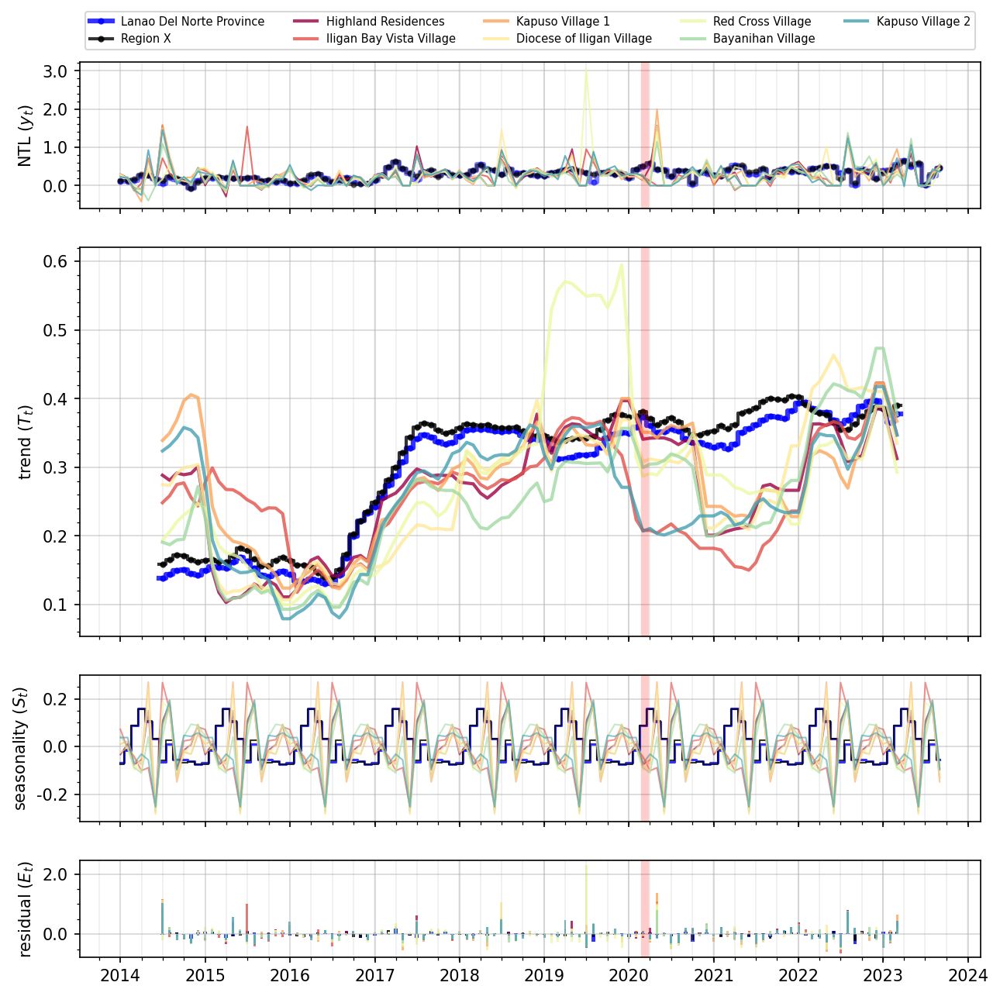

100%|██████████| 9/9 [00:00<00:00, 767.66it/s]


In [ ]:
Lanao_df, Lanao_stats = stats_summary(province = 'Lanao Del Norte', code = 67160, period = 12)

### Davao Oriental

Processing NTL extraction for Resettlement Sites in Davao Oriental Province, Region XI


STL Decomposition: 100%|██████████| 10/10 [00:00<00:00, 286.00it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 8/8 [00:01<00:00,  6.22it/s]


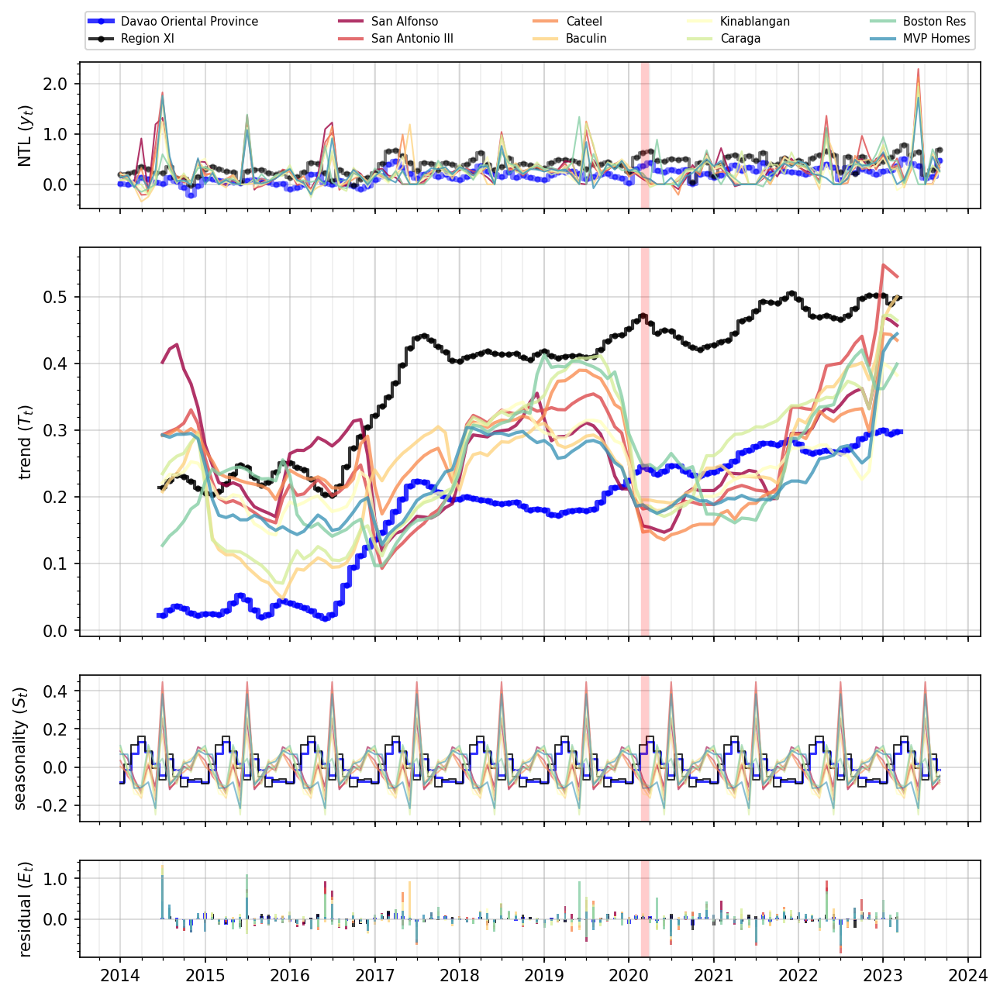

100%|██████████| 10/10 [00:00<00:00, 1235.44it/s]


In [ ]:
Davao_Or_df, Davao_Or_stats = stats_summary(province = 'Davao Oriental', code = 67161, period = 12)

### Davao de Oro

Processing NTL extraction for Resettlement Sites in Compostela Province, Region XI


STL Decomposition: 100%|██████████| 17/17 [00:00<00:00, 428.95it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 15/15 [00:02<00:00,  5.29it/s]


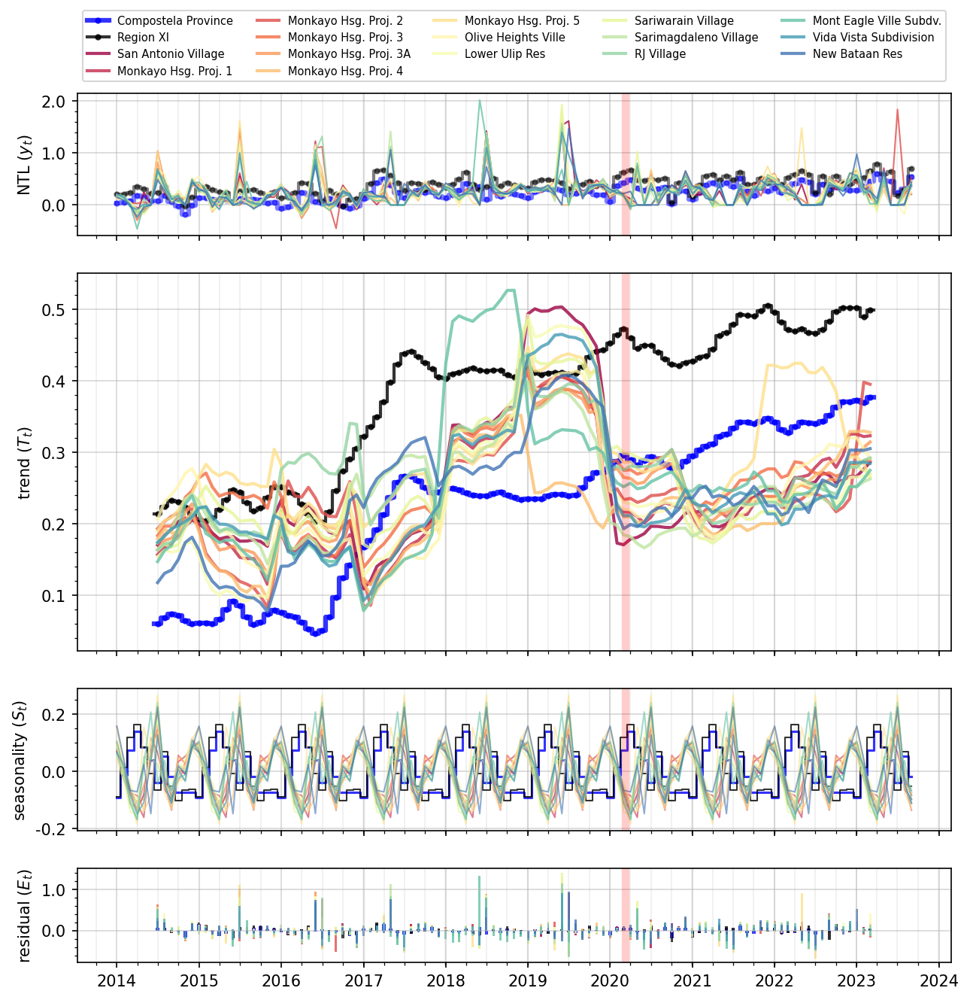

100%|██████████| 17/17 [00:00<00:00, 1182.53it/s]


In [ ]:
Davao_DO_df, Davao_DO_stats = stats_summary(province = 'Compostela', code = 67161, period = 12)

Processing NTL extraction for Resettlement Sites in Albay Province, Region V


STL Decomposition: 100%|██████████| 16/16 [00:00<00:00, 329.50it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 14/14 [00:02<00:00,  5.22it/s]


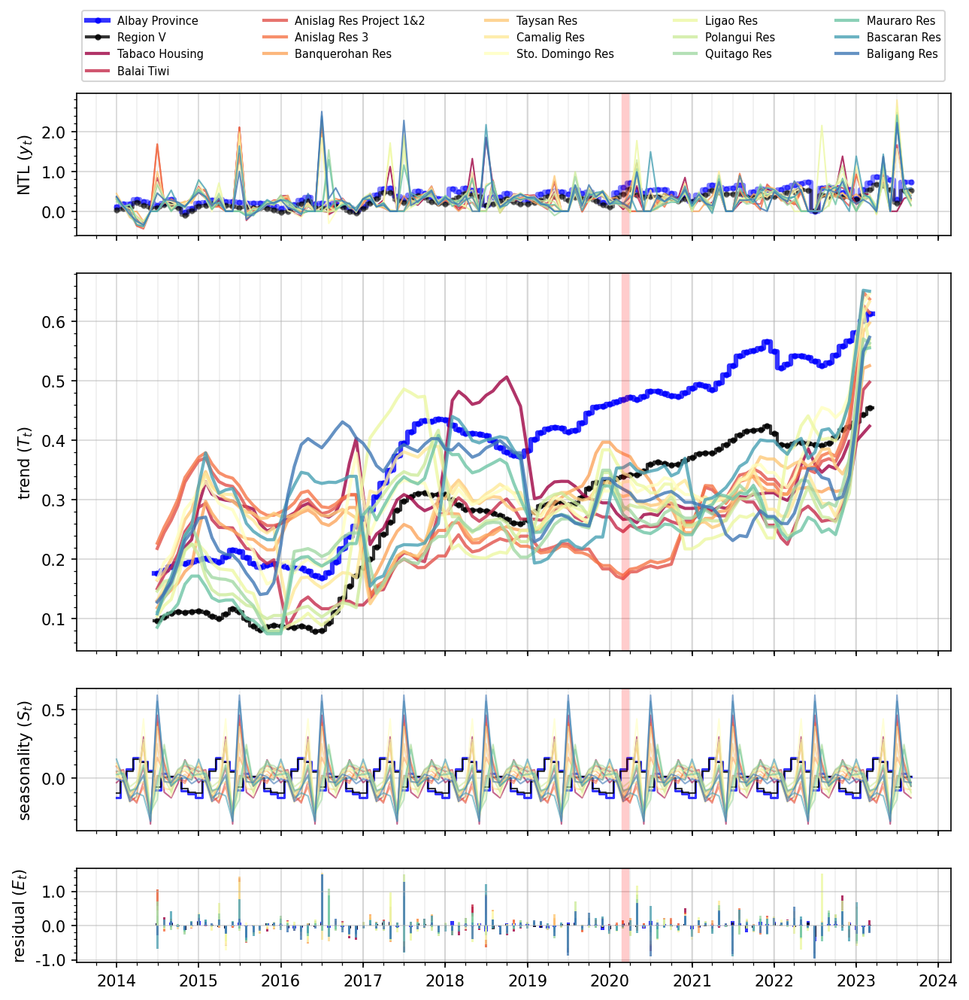

100%|██████████| 16/16 [00:00<00:00, 1416.55it/s]


In [ ]:
Albay_df, Albay_stats = stats_summary(province = 'Albay', code = 2361, period = 12)

### Bulacan

Processing NTL extraction for Resettlement Sites in Bulacan Province, Region III


STL Decomposition: 100%|██████████| 6/6 [00:00<00:00, 405.27it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 4/4 [00:00<00:00,  6.86it/s]


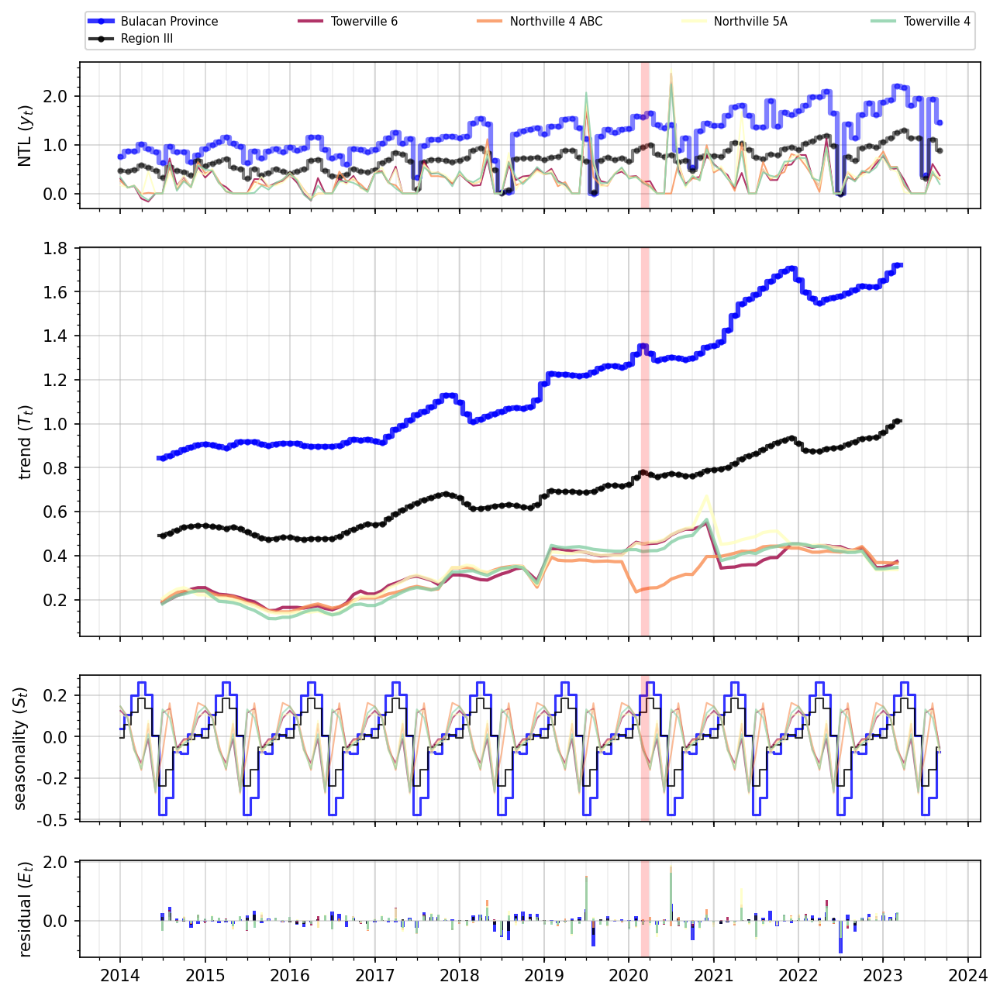

100%|██████████| 6/6 [00:00<00:00, 537.25it/s]


In [ ]:
Bulacan_df, Bulacan_stats = stats_summary(province = 'Bulacan', code = 67165, period = 12)

### Rizal

Processing NTL extraction for Resettlement Sites in Rizal Province, Region IV-A


STL Decomposition: 100%|██████████| 4/4 [00:00<00:00, 215.53it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s]


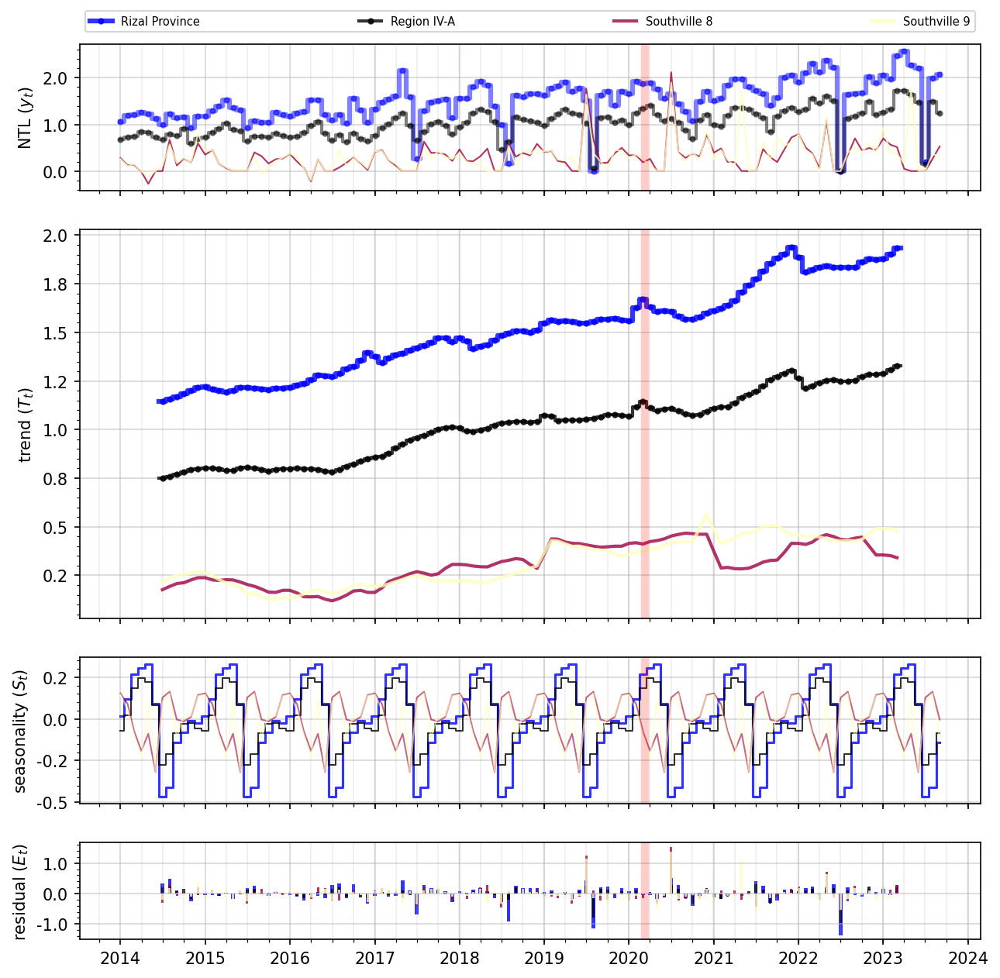

100%|██████████| 4/4 [00:00<00:00, 986.78it/s]


In [ ]:
Rizal_df, Rizal_stats = stats_summary(province = 'Rizal', code = 67166, period = 12)

### Laguna

Processing NTL extraction for Resettlement Sites in Laguna Province, Region IV-A


STL Decomposition: 100%|██████████| 6/6 [00:00<00:00, 508.78it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 4/4 [00:00<00:00,  4.19it/s]


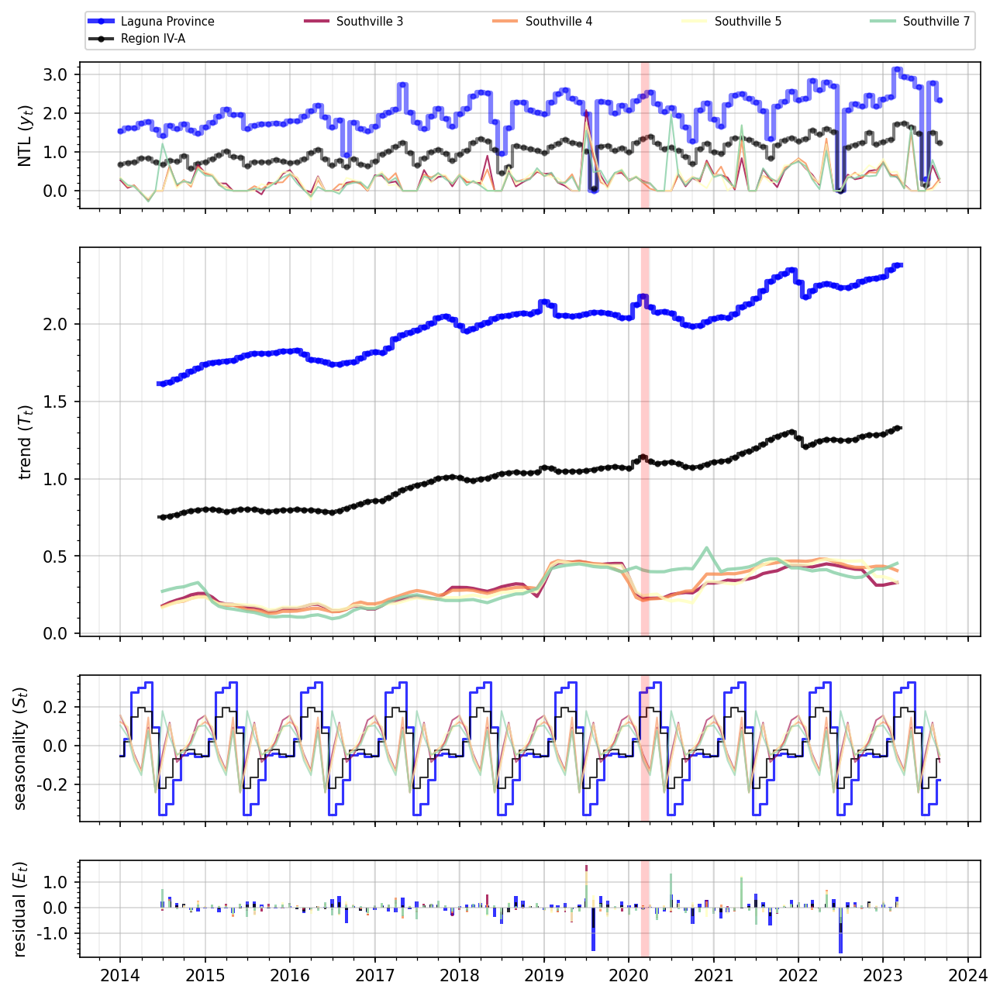

100%|██████████| 6/6 [00:00<00:00, 691.01it/s]


In [ ]:
Laguna_df, Laguna_stats = stats_summary(province = 'Laguna', code = 67166, period = 12)

### Iloilo

Processing NTL extraction for Resettlement Sites in Iloilo Province, Region VI


STL Decomposition: 100%|██████████| 32/32 [00:00<00:00, 717.12it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 30/30 [00:03<00:00,  7.73it/s]


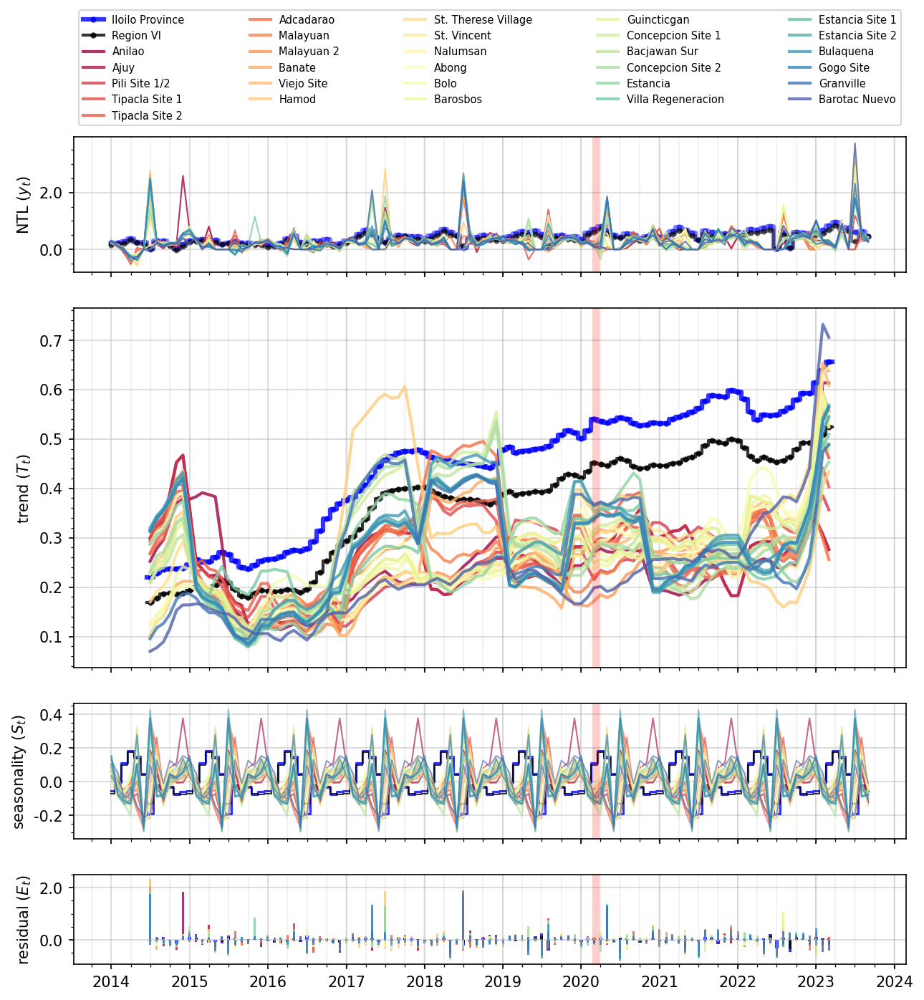

100%|██████████| 32/32 [00:00<00:00, 401.50it/s]


In [ ]:
Iloilo_df, Iloilo_stats = stats_summary(province = 'Iloilo', code = 2362, period = 12)


### Negros Oriental

Processing NTL extraction for Resettlement Sites in Negros Oriental Province, Region VI


STL Decomposition: 100%|██████████| 3/3 [00:00<00:00, 449.73it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 1/1 [00:00<00:00, 10.02it/s]


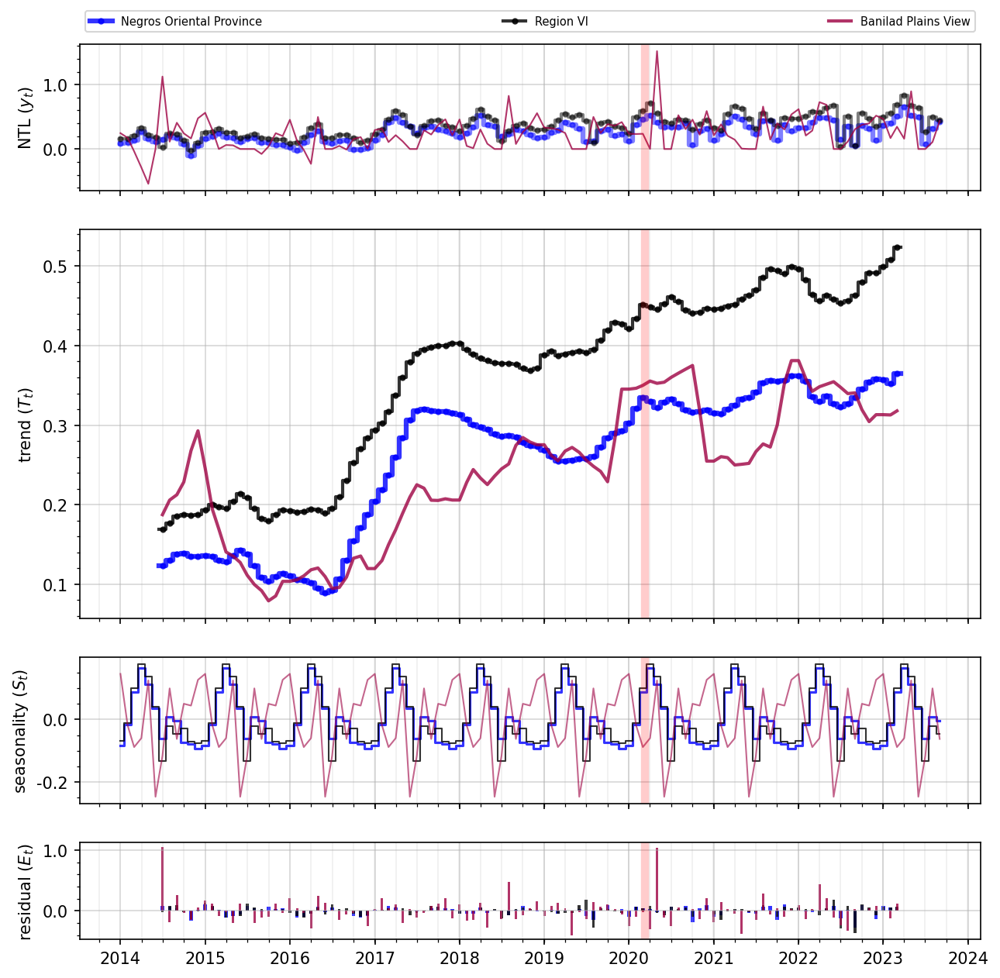

100%|██████████| 3/3 [00:00<00:00, 852.62it/s]


In [ ]:
Negros_Oriental_df, Negros_Oriental_df_stats = stats_summary(province = 'Negros Oriental', code = 2362, period = 12)

### Negros Occidental

Processing NTL extraction for Resettlement Sites in Negros Occidental Province, Region VI


STL Decomposition: 100%|██████████| 17/17 [00:00<00:00, 464.18it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 15/15 [00:03<00:00,  4.74it/s]


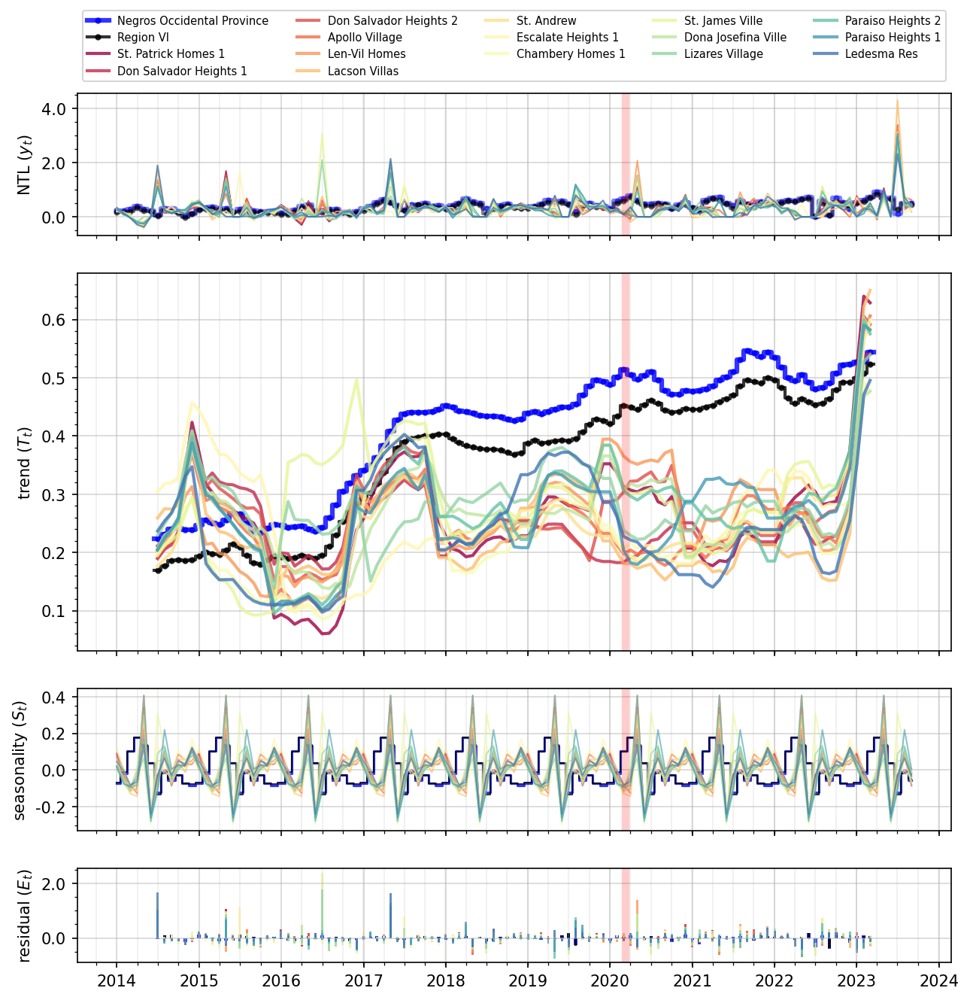

100%|██████████| 17/17 [00:00<00:00, 793.83it/s]


In [ ]:
Negros_Occidental_df, Negros_Occidental_stats = stats_summary(province = 'Negros Occidental', code = 2362, period = 12)


Capiz

Processing NTL extraction for Resettlement Sites in Capiz Province, Region VI


STL Decomposition: 100%|██████████| 9/9 [00:00<00:00, 631.23it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 7/7 [00:00<00:00,  8.60it/s]


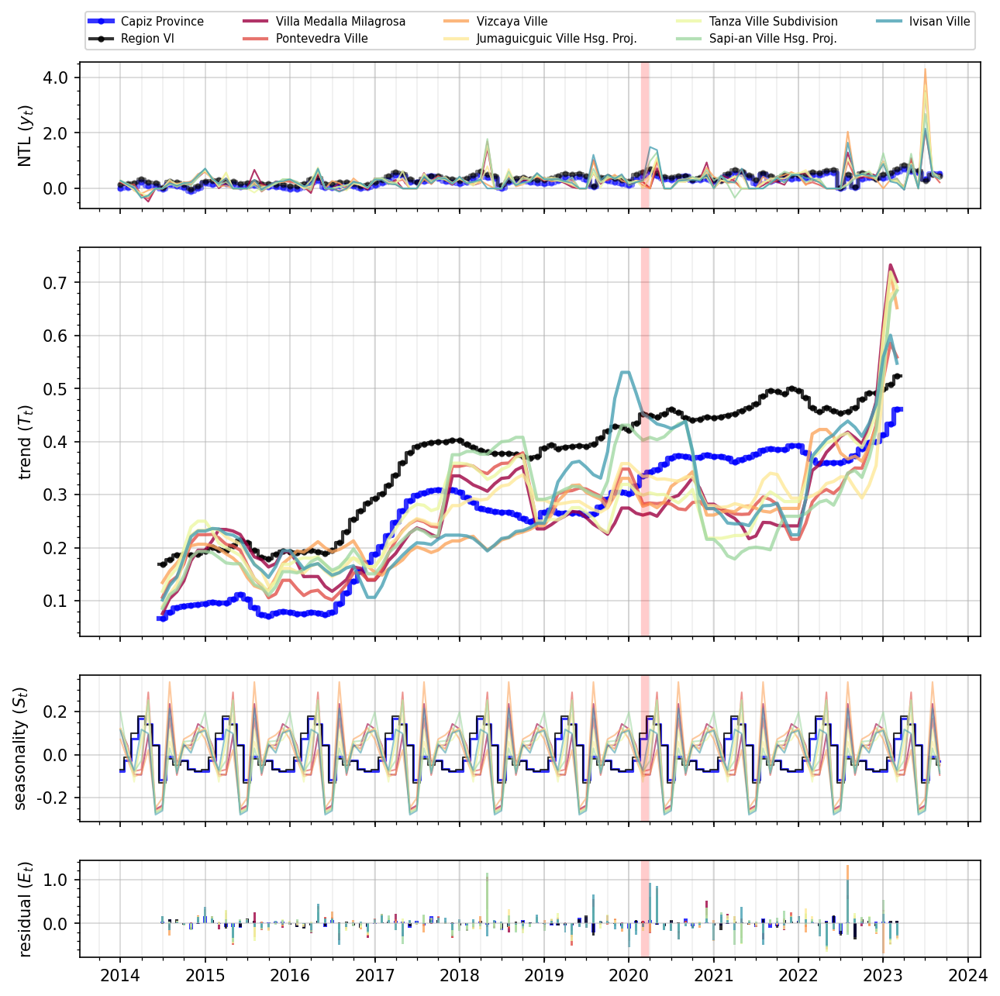

100%|██████████| 9/9 [00:00<00:00, 975.60it/s]


In [ ]:
Capiz_df, Capiz_stats = stats_summary(province = 'Capiz', code = 2362, period = 12)


Aurora

Processing NTL extraction for Resettlement Sites in Aurora Province, Region III


STL Decomposition: 100%|██████████| 5/5 [00:00<00:00, 415.18it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 3/3 [00:00<00:00,  9.37it/s]


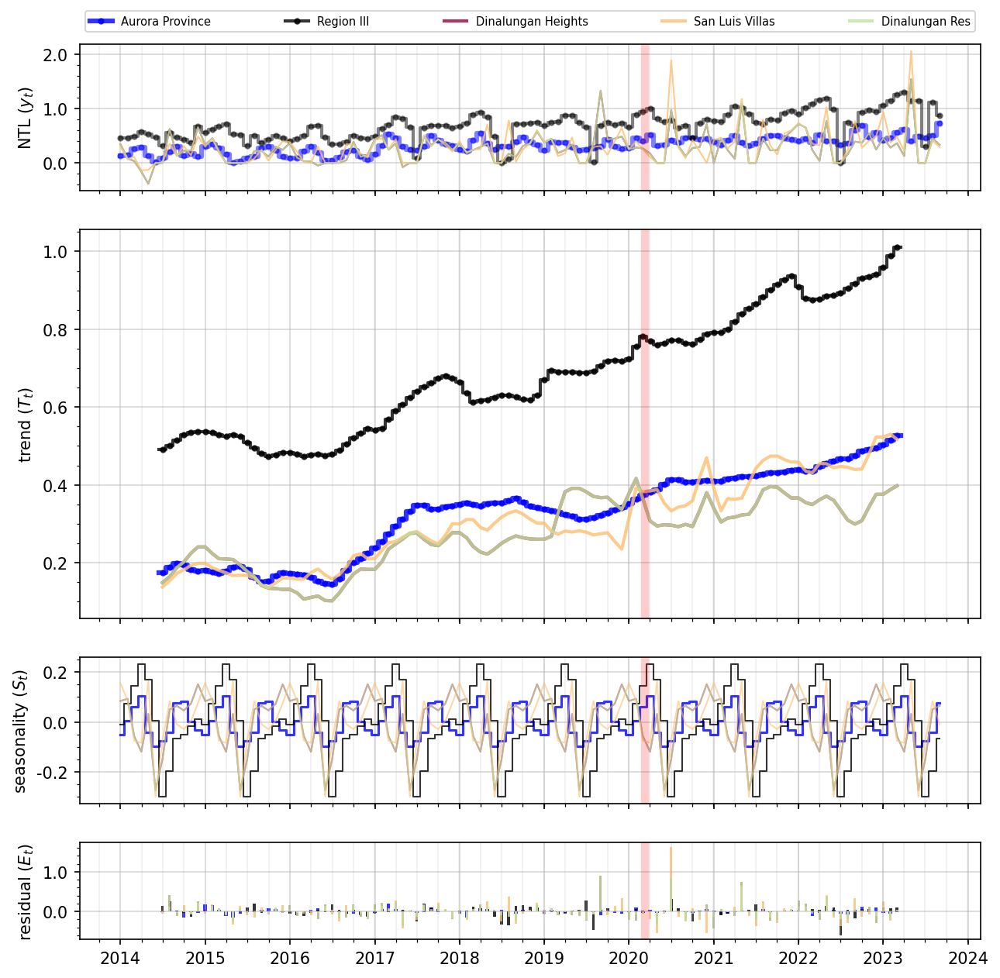

100%|██████████| 5/5 [00:00<00:00, 664.01it/s]


In [ ]:
Aurora_df, Aurora_stats = stats_summary(province = 'Aurora', code = 67165, period = 12)

Processing NTL extraction for Resettlement Sites in Palawan Province, Region IV-B


STL Decomposition: 100%|██████████| 6/6 [00:00<00:00, 239.14it/s]


Plotting timeseries NTL data


Processing: 100%|██████████| 4/4 [00:00<00:00,  8.36it/s]


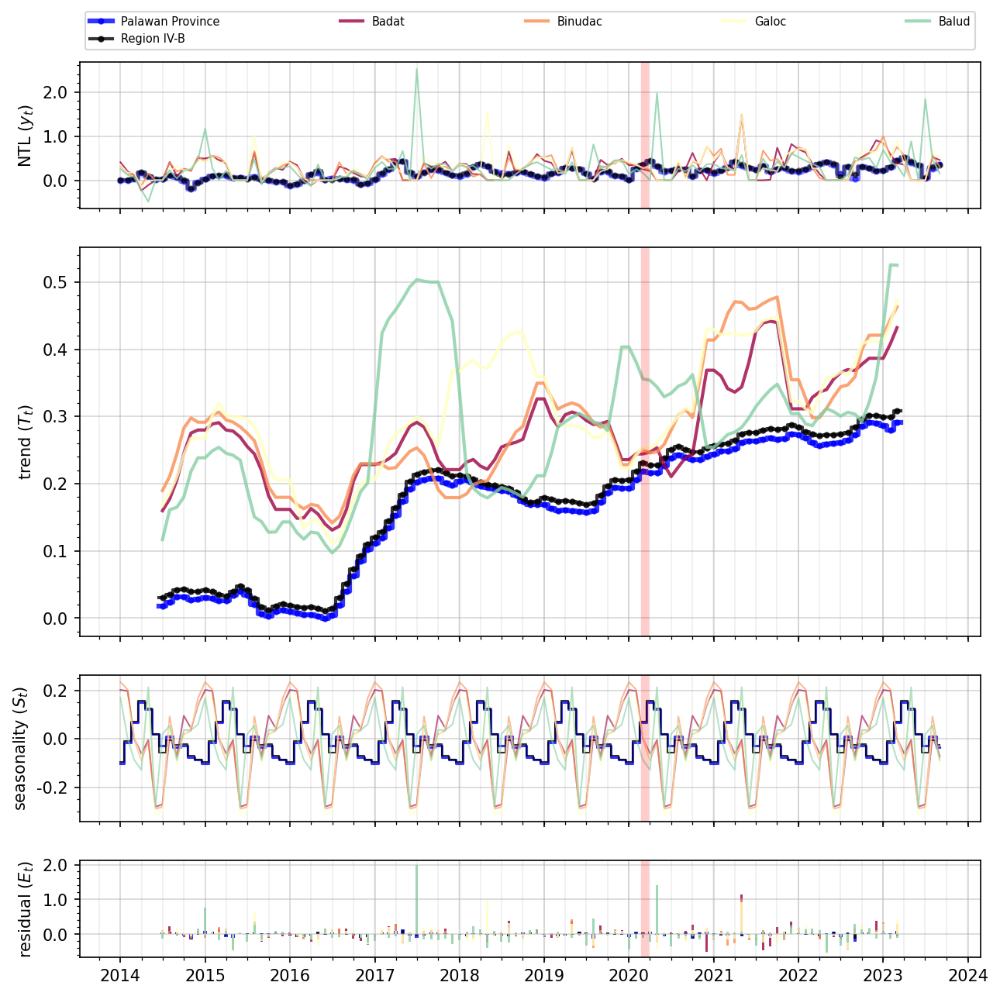

100%|██████████| 6/6 [00:00<00:00, 901.71it/s]


In [ ]:
Palawan_df, Palawan_stats = stats_summary(province = 'Palawan', code = 67167, period = 12)